In [1]:
pip install ultralytics opencv-python matplotlib kagglehub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.7/898.7 kB 16.1 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [2]:
from ultralytics import YOLO
import os
import random
import shutil
import numpy as np
import pandas as pd
import cv2
import yaml
import matplotlib.pyplot as plt
import glob
from sklearn.model_selection import train_test_split
import kagglehub
sshikamaru_car_object_detection_path = kagglehub.dataset_download('sshikamaru/car-object-detection')
print("Path to dataset files:", sshikamaru_car_object_detection_path)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Path to dataset files: /kaggle/input/car-object-detection


In [3]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/car-object-detection/data/sample_submission.csv
/kaggle/input/car-object-detection/data/train_solution_bounding_boxes (1).csv
/kaggle/input/car-object-detection/data/testing_images/vid_5_26420.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_31520.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_29420.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_31720.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_26560.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_27840.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_28560.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_28360.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_25240.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_29560.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_29020.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_30720.jpg
/kaggle/

In [4]:
!pip install ultralytics


In [5]:
DIR = "/kaggle/working/datasets/cars/"
IMAGES = DIR +"images/"
LABELS = DIR +"labels/"

TRAIN = "/kaggle/input/car-object-detection/data/training_images"
TEST = "/kaggle/input/car-object-detection/data/testing_images"

In [6]:
df = pd.read_csv("/kaggle/input/car-object-detection/data/train_solution_bounding_boxes (1).csv")
df

,image,xmin,ymin,xmax,ymax
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422
...,...,...,...,...,...
554,vid_4_9860.jpg,0.000000,198.321729,49.235251,236.223284
555,vid_4_9880.jpg,329.876184,156.482351,536.664239,250.497895
556,vid_4_9900.jpg,0.000000,168.295823,141.797524,239.176652
557,vid_4_9960.jpg,487.428988,172.233646,616.917699,228.839864


In [7]:
files = list(df.image.unique())
files_train, files_valid = train_test_split(files, test_size = 0.2)

In [8]:
os.makedirs(IMAGES+"train", exist_ok=True)
os.makedirs(LABELS+"train", exist_ok=True)
os.makedirs(IMAGES+"valid", exist_ok=True)
os.makedirs(LABELS+"valid", exist_ok=True)

In [9]:
train_filename = set(files_train)
valid_filename = set(files_valid)
for file in glob.glob(TRAIN+'/*'):
    fname =os.path.basename(file)
    if fname in train_filename:
        shutil.copy(file,IMAGES+'train')
    elif fname in valid_filename:
        shutil.copy(file,IMAGES+'valid')

In [10]:
for _, row in df.iterrows():
    image_file = row['image']
    class_id = "0"
    x = row['xmin']
    y = row['ymin']
    width = row['xmax'] - row['xmin']
    height = row['ymax'] - row['ymin']
    x_center = x + (width / 2)
    y_center = y + (height / 2)
    x_center /= 676
    y_center /= 380
    width /= 676
    height /= 380

    if image_file in train_filename:
        annotation_file = os.path.join(LABELS) + "train/" + image_file.replace('.jpg', '.txt')
    else:
        annotation_file = os.path.join(LABELS) + "valid/" + image_file.replace('.jpg', '.txt')

    with open(annotation_file, 'a') as ann_file:
        ann_file.write(f"{class_id} {x_center} {y_center} {width} {height}\n")

In [11]:
%%writefile dataset.yaml
# Path
path: ./cars
train: images/train
val: images/valid

# Classes
nc: 1
names: ['car']

Writing dataset.yaml


In [12]:
model = YOLO('yolov8m.pt')
model.train(data="dataset.yaml", epochs=90, batch=16)

100%|██████████| 49.7M/49.7M [00:00<00:00, 273MB/s]


Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=dataset.yaml, epochs=90, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=No

100%|██████████| 755k/755k [00:00<00:00, 17.4MB/s]
2024-12-12 12:48:23,472	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-12-12 12:48:24,014	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 74.3MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/datasets/cars/labels/train... 284 images, 0 backgrounds, 0 corrupt: 100%|██████████| 284/284 [00:00<00:00, 1163.36it/s]

train: New cache created: /kaggle/working/datasets/cars/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/datasets/cars/labels/valid... 71 images, 0 backgrounds, 0 corrupt: 100%|██████████| 71/71 [00:00<00:00, 964.12it/s]

val: New cache created: /kaggle/working/datasets/cars/labels/valid.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 90 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/90      6.81G      1.653      2.378      1.386         39        640: 100%|██████████| 18/18 [00:09<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]

                   all         71        102      0.145      0.833      0.147     0.0855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/90      6.84G      1.349     0.8932      1.249         31        640: 100%|██████████| 18/18 [00:08<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.02it/s]

                   all         71        102      0.786      0.833      0.886      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/90      6.83G      1.324     0.9491      1.235         39        640: 100%|██████████| 18/18 [00:08<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.11it/s]

                   all         71        102     0.0153      0.402    0.00833    0.00514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/90      6.79G      1.318     0.8053      1.278         33        640: 100%|██████████| 18/18 [00:08<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.11it/s]

                   all         71        102     0.0104      0.098    0.00227    0.00102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/90      6.77G      1.355     0.8203      1.259         41        640: 100%|██████████| 18/18 [00:08<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.06it/s]

                   all         71        102    0.00593     0.0392    0.00145   0.000429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/90      6.85G      1.325     0.7657      1.293         37        640: 100%|██████████| 18/18 [00:08<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.95it/s]

                   all         71        102     0.0331      0.137     0.0153    0.00709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/90      6.74G      1.315     0.7757      1.259         37        640: 100%|██████████| 18/18 [00:08<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.05it/s]

                   all         71        102     0.0352     0.0098   0.000697   0.000242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/90      6.83G      1.362     0.7549      1.315         35        640: 100%|██████████| 18/18 [00:08<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.15it/s]

                   all         71        102     0.0352     0.0098   0.000697   0.000242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/90      6.79G      1.249     0.7033      1.237         38        640: 100%|██████████| 18/18 [00:08<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.09it/s]

                   all         71        102   0.000141     0.0098   7.13e-05   2.14e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/90      6.83G      1.254     0.6525      1.215         31        640: 100%|██████████| 18/18 [00:08<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.87it/s]

                   all         71        102       0.92      0.814      0.859      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/90      6.76G      1.262     0.6606      1.239         48        640: 100%|██████████| 18/18 [00:08<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.88it/s]

                   all         71        102      0.851      0.781      0.798      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/90      6.85G      1.315     0.6661      1.245         26        640: 100%|██████████| 18/18 [00:08<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.85it/s]

                   all         71        102      0.919      0.892      0.944      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/90      6.78G      1.257     0.6397      1.233         40        640: 100%|██████████| 18/18 [00:09<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.83it/s]

                   all         71        102      0.857      0.843      0.923      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/90      6.83G      1.247     0.6313      1.213         39        640: 100%|██████████| 18/18 [00:09<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.90it/s]

                   all         71        102      0.941      0.922      0.957      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/90      6.74G      1.215     0.6167      1.191         39        640: 100%|██████████| 18/18 [00:09<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.81it/s]

                   all         71        102      0.946      0.843      0.942      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/90      6.83G      1.213     0.5873      1.214         38        640: 100%|██████████| 18/18 [00:09<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.79it/s]

                   all         71        102      0.192       0.48      0.144     0.0867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/90      6.77G      1.225     0.6005      1.221         42        640: 100%|██████████| 18/18 [00:09<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.67it/s]

                   all         71        102      0.112      0.353     0.0546     0.0254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/90      6.82G        1.2     0.5829        1.2         42        640: 100%|██████████| 18/18 [00:09<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.76it/s]

                   all         71        102      0.959      0.941      0.979      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/90      6.79G      1.243     0.6011      1.191         37        640: 100%|██████████| 18/18 [00:09<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.76it/s]

                   all         71        102      0.928      0.951       0.98      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/90      6.85G      1.158      0.557      1.173         35        640: 100%|██████████| 18/18 [00:09<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.70it/s]

                   all         71        102       0.94      0.928      0.982       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/90      6.75G      1.184     0.5792      1.192         45        640: 100%|██████████| 18/18 [00:09<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.69it/s]

                   all         71        102       0.98      0.967      0.987      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/90      6.84G      1.198     0.5848      1.187         41        640: 100%|██████████| 18/18 [00:09<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.68it/s]

                   all         71        102      0.961      0.967      0.982      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/90       6.8G      1.178      0.564      1.208         50        640: 100%|██████████| 18/18 [00:09<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.75it/s]

                   all         71        102      0.988      0.951       0.99      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/90      6.83G       1.15     0.5624       1.18         29        640: 100%|██████████| 18/18 [00:09<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.75it/s]

                   all         71        102      0.977      0.961       0.99      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/90      6.77G      1.174     0.5469       1.16         41        640: 100%|██████████| 18/18 [00:09<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.71it/s]

                   all         71        102      0.938      0.971      0.989      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/90      6.82G      1.151     0.5397      1.185         47        640: 100%|██████████| 18/18 [00:09<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.70it/s]

                   all         71        102       0.99      0.945      0.989      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/90      6.82G      1.133      0.532      1.149         39        640: 100%|██████████| 18/18 [00:09<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.62it/s]

                   all         71        102      0.978      0.961      0.991      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/90      6.85G      1.149     0.5429       1.16         38        640: 100%|██████████| 18/18 [00:09<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.74it/s]

                   all         71        102       0.99      0.948      0.981       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/90      6.75G      1.143     0.5627      1.183         31        640: 100%|██████████| 18/18 [00:09<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.71it/s]

                   all         71        102      0.971      0.971      0.991      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/90      6.82G      1.106      0.515      1.164         32        640: 100%|██████████| 18/18 [00:09<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.70it/s]

                   all         71        102       0.96       0.94      0.986      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/90      6.78G      1.138     0.5249       1.17         32        640: 100%|██████████| 18/18 [00:09<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.53it/s]

                   all         71        102      0.964      0.931      0.986       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/90      6.86G      1.119     0.5277      1.147         32        640: 100%|██████████| 18/18 [00:09<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.64it/s]

                   all         71        102      0.969      0.941      0.989      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/90      6.79G      1.102     0.5022      1.155         33        640: 100%|██████████| 18/18 [00:09<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.74it/s]

                   all         71        102      0.979      0.929      0.987      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/90      6.83G      1.099     0.4875      1.143         38        640: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.75it/s]

                   all         71        102       0.98      0.949       0.99      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/90      6.79G      1.067     0.4997      1.134         34        640: 100%|██████████| 18/18 [00:09<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.67it/s]

                   all         71        102      0.942       0.98       0.99      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/90      6.82G      1.093      0.503      1.139         28        640: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.74it/s]

                   all         71        102          1      0.943       0.99      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/90      6.74G      1.047     0.4934      1.123         40        640: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.68it/s]

                   all         71        102      0.997      0.931      0.986      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/90      6.85G      1.047       0.48      1.135         37        640: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.75it/s]

                   all         71        102       0.99      0.942       0.99      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/90      6.79G       1.09     0.4871      1.121         40        640: 100%|██████████| 18/18 [00:09<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.57it/s]

                   all         71        102       0.98      0.953      0.991      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/90      6.82G       1.02     0.4818      1.115         34        640: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.68it/s]

                   all         71        102      0.951      0.971      0.991      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/90      6.77G      1.014     0.4836      1.109         32        640: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.67it/s]

                   all         71        102      0.967      0.951      0.991      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/90      6.83G      1.071     0.5046      1.127         42        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.73it/s]

                   all         71        102      0.971       0.97      0.992      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/90      6.77G      1.017     0.4773      1.112         32        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.65it/s]

                   all         71        102      0.982      0.951      0.992      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/90      6.81G      1.036     0.4812      1.123         44        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.67it/s]

                   all         71        102      0.977       0.98      0.993      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/90      6.78G      1.054     0.4699      1.114         42        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.63it/s]

                   all         71        102      0.979      0.961      0.991      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/90      6.81G      1.023     0.4813      1.128         40        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.69it/s]

                   all         71        102       0.97      0.964      0.992       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/90      6.73G     0.9908     0.4608      1.117         40        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.59it/s]

                   all         71        102       0.99       0.97       0.99      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/90      6.82G      1.011     0.4585      1.103         28        640: 100%|██████████| 18/18 [00:09<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.75it/s]

                   all         71        102      0.976      0.971       0.99      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/90      6.75G     0.9814     0.4438      1.067         32        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.60it/s]

                   all         71        102      0.988      0.961       0.99      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/90      6.82G      1.025     0.4623      1.135         46        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.72it/s]

                   all         71        102       0.99       0.96      0.992       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/90      6.81G     0.9874      0.448       1.09         41        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.65it/s]

                   all         71        102      0.971      0.979      0.992      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/90      6.85G     0.9858     0.4645      1.105         48        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.66it/s]

                   all         71        102      0.971       0.97      0.992      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/90      6.76G     0.9593     0.4351       1.08         45        640: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.65it/s]

                   all         71        102       0.98       0.97      0.991       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/90      6.84G     0.9248     0.4213      1.072         23        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.71it/s]

                   all         71        102      0.987      0.971      0.993      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/90       6.8G     0.9722     0.4462      1.075         34        640: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.65it/s]

                   all         71        102      0.986      0.951      0.993      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/90      6.83G     0.9503     0.4465      1.068         26        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.70it/s]

                   all         71        102      0.971      0.977      0.993      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/90      6.78G     0.9458      0.433      1.074         43        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.63it/s]

                   all         71        102       0.98      0.977      0.994      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/90      6.85G     0.9187     0.4322      1.052         34        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.70it/s]

                   all         71        102      0.982      0.951      0.992      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/90      6.78G     0.9358     0.4241      1.069         33        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.65it/s]

                   all         71        102      0.961      0.976      0.992      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/90      6.82G     0.8931      0.418      1.031         36        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.73it/s]

                   all         71        102      0.995      0.941      0.993      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/90      6.78G      0.878     0.4044      1.044         34        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.67it/s]

                   all         71        102      0.983      0.951      0.993      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/90      6.82G     0.9251     0.4224      1.064         46        640: 100%|██████████| 18/18 [00:09<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.70it/s]

                   all         71        102      0.994      0.951      0.993      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/90      6.77G     0.9063      0.424       1.06         37        640: 100%|██████████| 18/18 [00:09<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.62it/s]

                   all         71        102       0.99      0.956      0.994      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/90      6.85G     0.8883     0.4016      1.045         32        640: 100%|██████████| 18/18 [00:09<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.60it/s]

                   all         71        102       0.99      0.955      0.994      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/90      6.73G     0.8576     0.4092      1.039         38        640: 100%|██████████| 18/18 [00:09<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.66it/s]

                   all         71        102       0.99      0.961      0.994      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/90      6.83G     0.8596      0.402      1.033         28        640: 100%|██████████| 18/18 [00:09<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.64it/s]

                   all         71        102      0.987      0.961      0.994       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/90      6.75G     0.8218     0.3792      1.023         34        640: 100%|██████████| 18/18 [00:09<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.61it/s]

                   all         71        102      0.997      0.961      0.993      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/90      6.83G     0.8378     0.3912      1.019         35        640: 100%|██████████| 18/18 [00:09<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.71it/s]

                   all         71        102      0.994      0.961      0.994      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/90      6.77G     0.8295     0.3745     0.9986         36        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.58it/s]

                   all         71        102      0.967       0.98      0.994       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/90      6.84G     0.8115     0.3797      1.009         43        640: 100%|██████████| 18/18 [00:09<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.67it/s]

                   all         71        102       0.99      0.943      0.993      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/90      6.78G     0.8273     0.3851      1.012         38        640: 100%|██████████| 18/18 [00:09<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.71it/s]

                   all         71        102      0.971       0.98      0.993      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/90      6.82G     0.8345     0.3805      1.017         32        640: 100%|██████████| 18/18 [00:09<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.70it/s]

                   all         71        102      0.968       0.98      0.993      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/90      6.77G     0.8302     0.3839       1.02         35        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.73it/s]

                   all         71        102      0.961      0.966      0.993      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/90      6.83G     0.7882     0.3796     0.9925         30        640: 100%|██████████| 18/18 [00:09<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.69it/s]

                   all         71        102      0.969       0.98      0.994        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/90      6.79G     0.8058      0.371     0.9962         31        640: 100%|██████████| 18/18 [00:09<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.71it/s]

                   all         71        102      0.968       0.98      0.994      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      76/90      6.84G     0.7994     0.3781      1.011         40        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.68it/s]

                   all         71        102          1      0.964      0.994      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      77/90      6.79G     0.7856     0.3705     0.9956         40        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.71it/s]

                   all         71        102       0.99       0.98      0.994      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      78/90      6.85G     0.7541     0.3598     0.9844         29        640: 100%|██████████| 18/18 [00:09<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.63it/s]

                   all         71        102      0.987      0.971      0.994      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      79/90      6.77G     0.7344     0.3513     0.9781         39        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.69it/s]

                   all         71        102      0.969       0.98      0.993      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      80/90      6.86G      0.755     0.3625     0.9761         23        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.65it/s]

                   all         71        102       0.99      0.963      0.994      0.717


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      81/90      6.73G     0.7433     0.3429     0.9948         20        640: 100%|██████████| 18/18 [00:10<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.68it/s]

                   all         71        102       0.99      0.971      0.994      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      82/90      6.83G     0.7452     0.3498     0.9884         20        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.71it/s]

                   all         71        102          1      0.968      0.994      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      83/90      6.73G     0.7249     0.3397     0.9729         17        640: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.63it/s]

                   all         71        102       0.98       0.98      0.994      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      84/90      6.83G     0.7139     0.3312     0.9876         15        640: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.65it/s]

                   all         71        102      0.979       0.98      0.994      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      85/90      6.78G     0.7177     0.3371     0.9732         15        640: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.67it/s]

                   all         71        102      0.979       0.98      0.994      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      86/90      6.82G     0.6877     0.3344     0.9633         20        640: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.72it/s]

                   all         71        102      0.977       0.98      0.994      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      87/90      6.73G     0.6919     0.3265     0.9667         18        640: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.64it/s]

                   all         71        102       0.98      0.972      0.994      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      88/90      6.82G     0.6633     0.3198      0.969         13        640: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.71it/s]

                   all         71        102      0.978       0.98      0.994      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      89/90      6.73G     0.6679     0.3262     0.9628         15        640: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.33it/s]

                   all         71        102       0.97       0.98      0.994      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      90/90      6.82G     0.6925     0.3347     0.9591         16        640: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.70it/s]

                   all         71        102       0.99      0.969      0.994      0.716



90 epochs completed in 0.285 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.0MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 218 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.62it/s]


                   all         71        102      0.971       0.97      0.992       0.72
Speed: 0.1ms preprocess, 6.3ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c3faa165ab0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [13]:
metrics=model.val()

Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 218 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/datasets/cars/labels/valid.cache... 71 images, 0 backgrounds, 0 corrupt: 100%|██████████| 71/71 [00:00<?, ?it/s]
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]


                   all         71        102      0.971       0.97      0.992      0.722
Speed: 0.2ms preprocess, 14.3ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/train2


In [14]:
model = YOLO('./runs/detect/train/weights/last.pt')
ret = model("/kaggle/input/car-object-detection/data/testing_images",save=True, conf=0.2, iou=0.5)


image 1/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25100.jpg: 384x640 (no detections), 42.3ms
image 2/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25120.jpg: 384x640 (no detections), 25.1ms
image 3/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25140.jpg: 384x640 (no detections), 25.1ms
image 4/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25160.jpg: 384x640 (no detections), 22.5ms
image 5/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25180.jpg: 384x640 (no detections), 18.7ms
image 6/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25200.jpg: 384x640 (no detections), 18.7ms
image 7/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25220.jpg: 384x640 (no detections), 18.7ms
image 8/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25240.jpg: 384x640 (no detections), 18.7ms
image 9/175 /kaggle/input/car-object-detection/data/testing_images/vid_

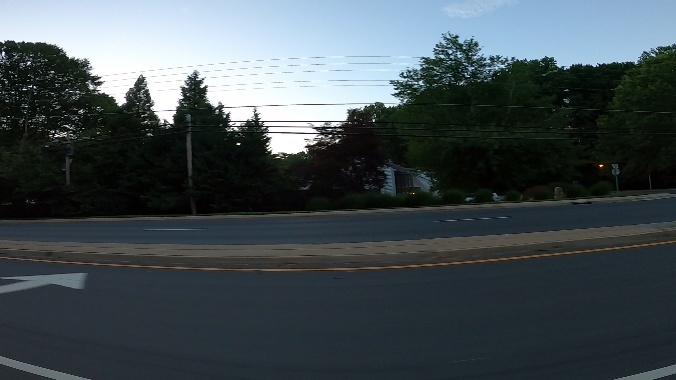

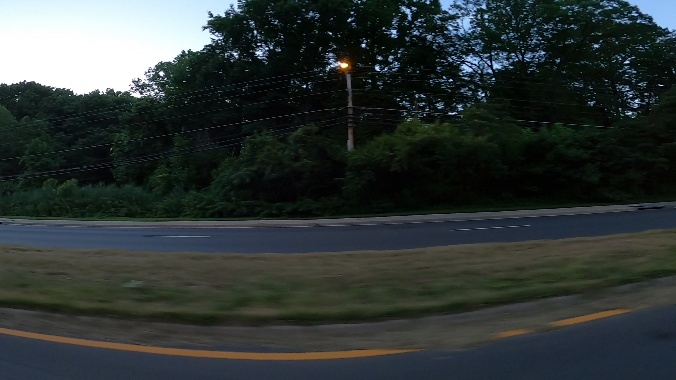

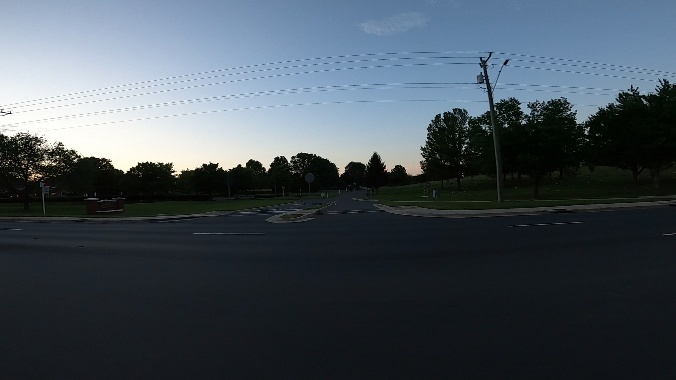

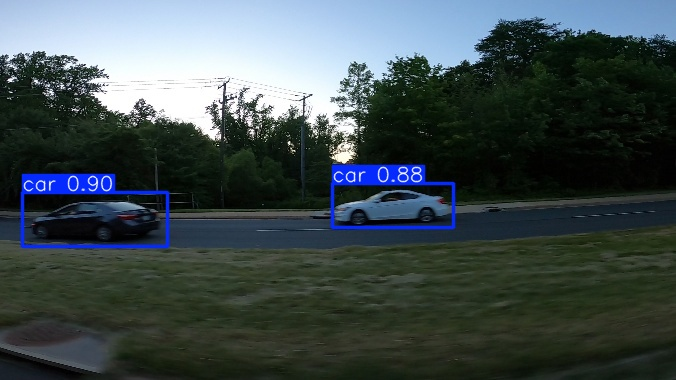

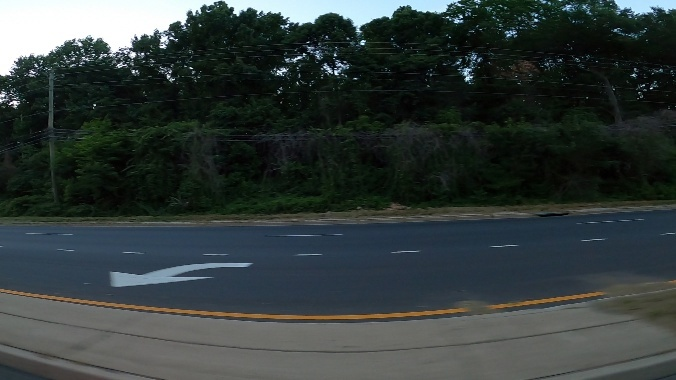

...

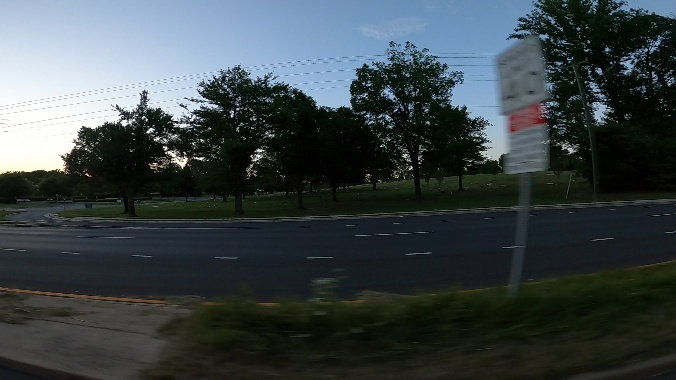

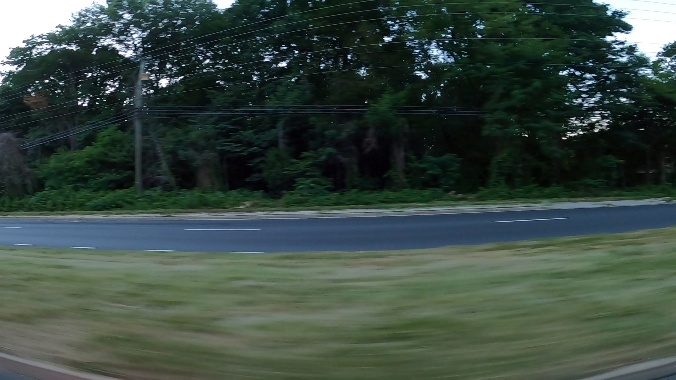

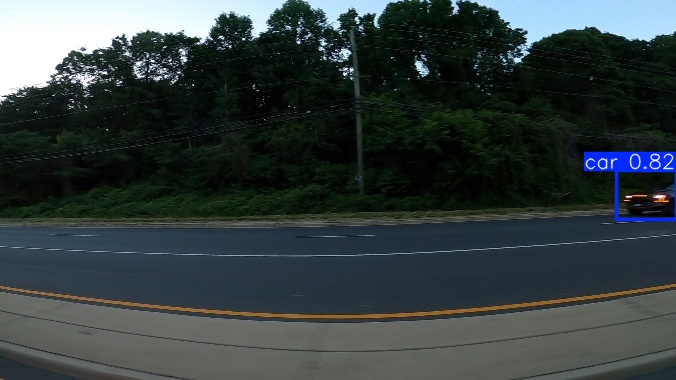

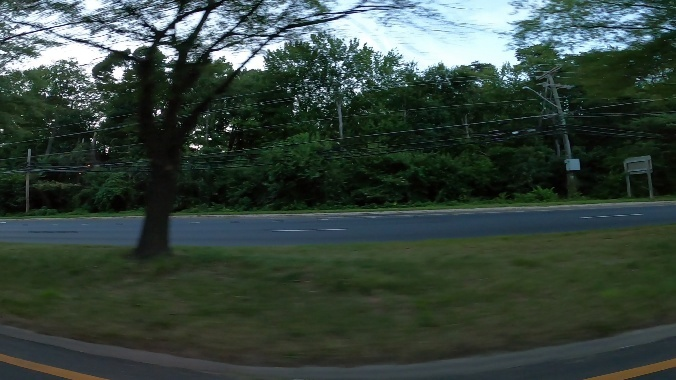

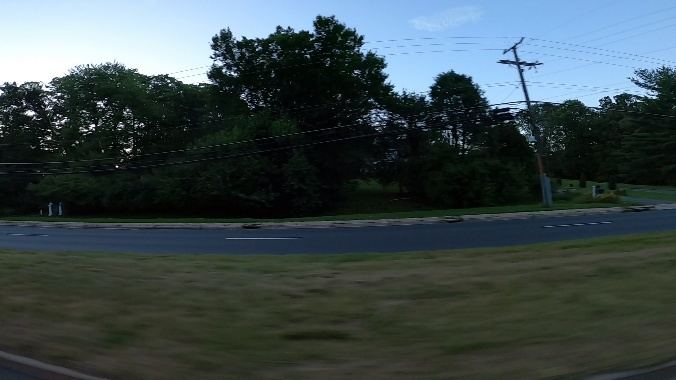

In [15]:
from IPython.display import Image

files = glob.glob("./runs/detect/predict/*")
for i in range(0, 40, 3):
    img = Image(files[i])
    display(img)


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_10100.jpg: 384x640 1 car, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


<Figure size 2000x1000 with 0 Axes>

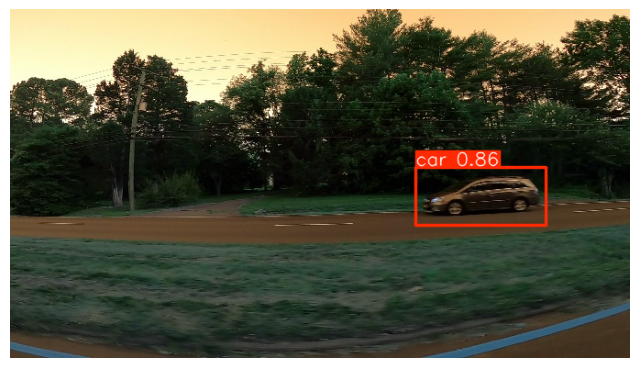


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_8700.jpg: 384x640 1 car, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


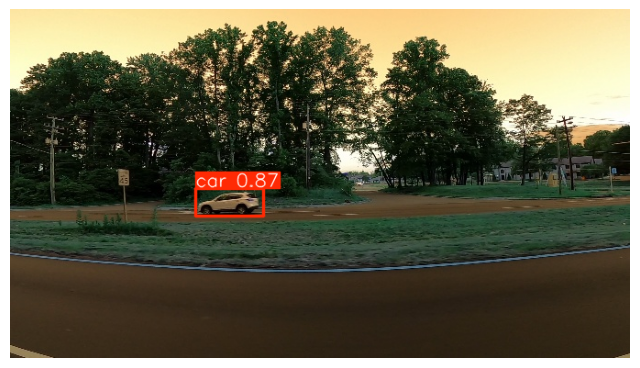


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_860.jpg: 384x640 1 car, 11.6ms
Speed: 1.9ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


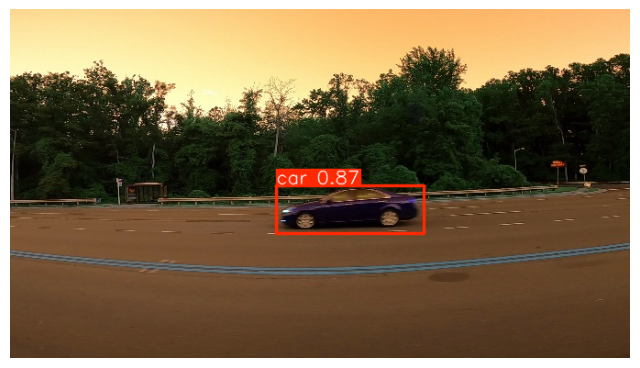


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_900.jpg: 384x640 1 car, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


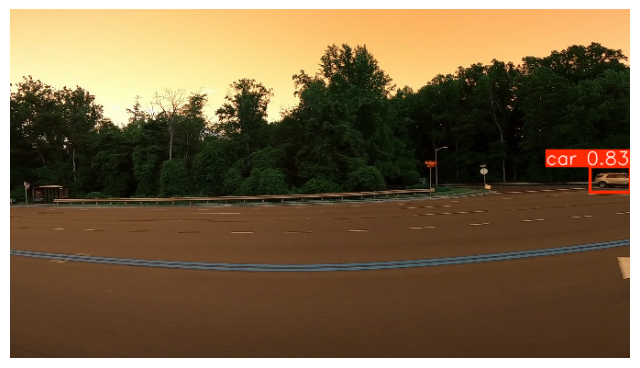


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_21160.jpg: 384x640 1 car, 11.6ms
Speed: 1.8ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


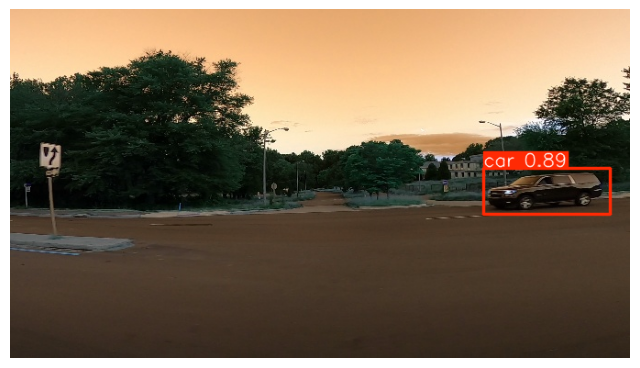


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_3360.jpg: 384x640 1 car, 11.6ms
Speed: 1.8ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


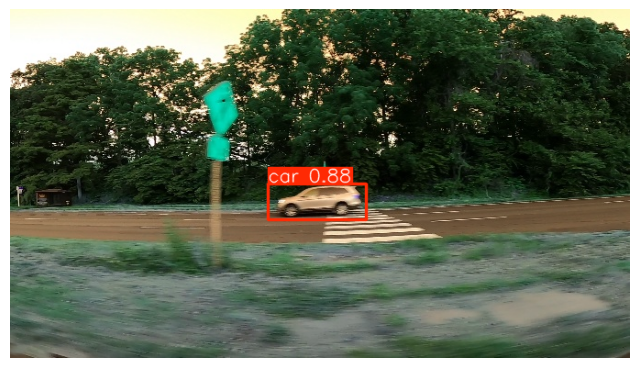


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_13840.jpg: 384x640 2 cars, 11.6ms
Speed: 1.8ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


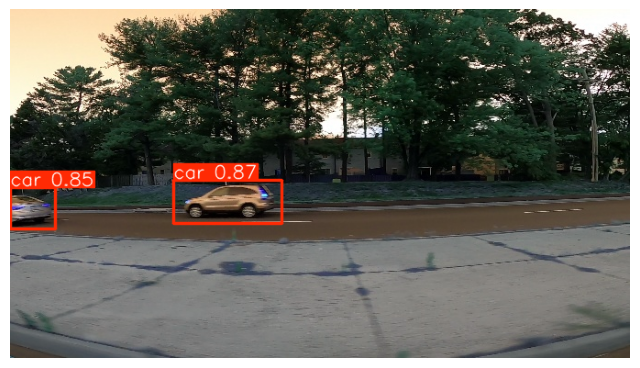


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_2200.jpg: 384x640 1 car, 25.2ms
Speed: 2.5ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


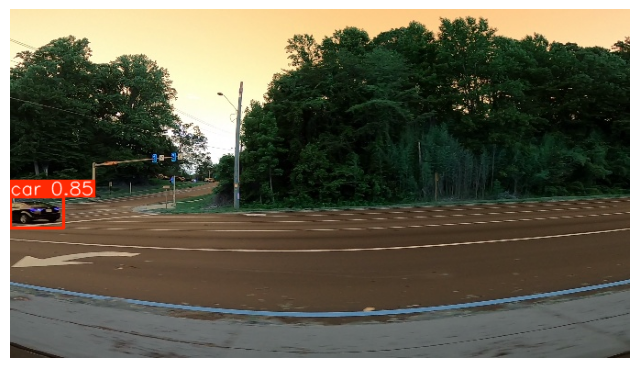


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_11400.jpg: 384x640 1 car, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


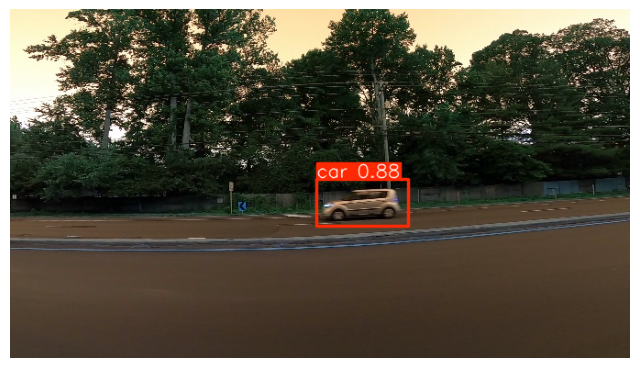


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_3180.jpg: 384x640 2 cars, 25.1ms
Speed: 1.6ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


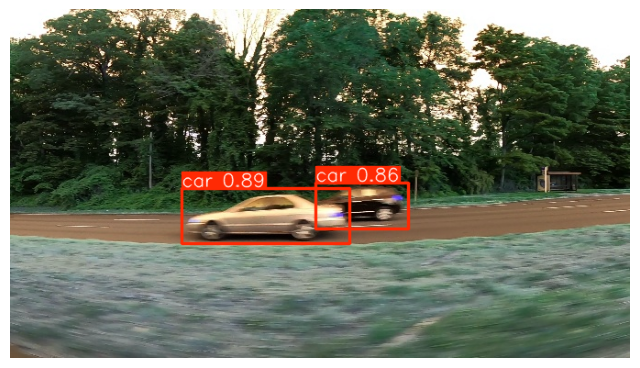


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_8240.jpg: 384x640 1 car, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


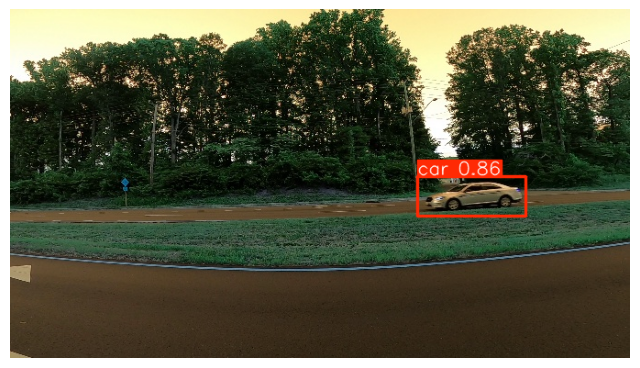


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_21520.jpg: 384x640 1 car, 25.2ms
Speed: 2.4ms preprocess, 25.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


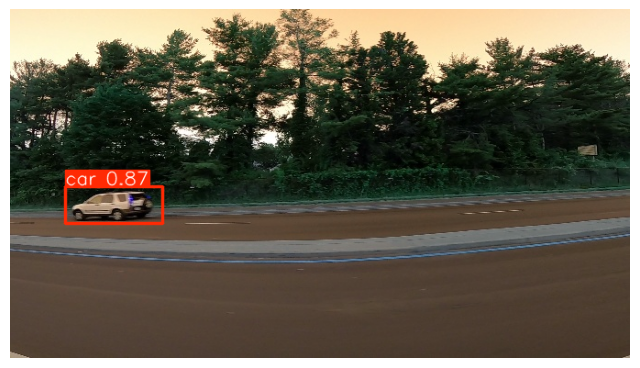


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_21660.jpg: 384x640 1 car, 25.2ms
Speed: 2.5ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


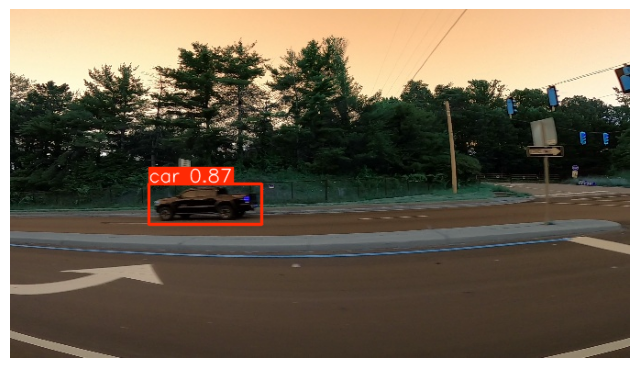


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_2180.jpg: 384x640 1 car, 25.2ms
Speed: 2.6ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


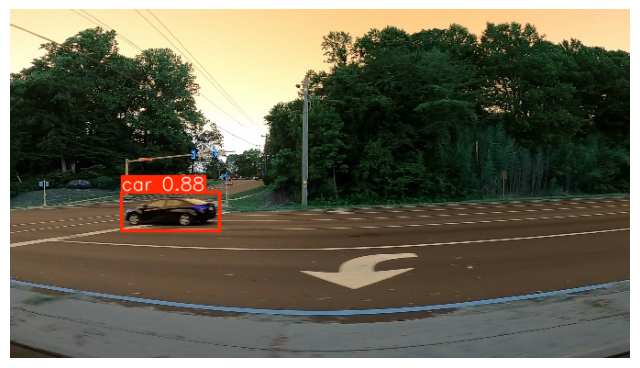


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_26320.jpg: 384x640 2 cars, 25.2ms
Speed: 2.6ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


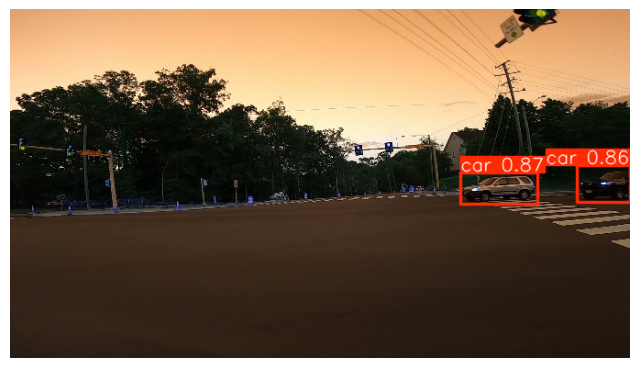


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_3200.jpg: 384x640 2 cars, 25.2ms
Speed: 2.5ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


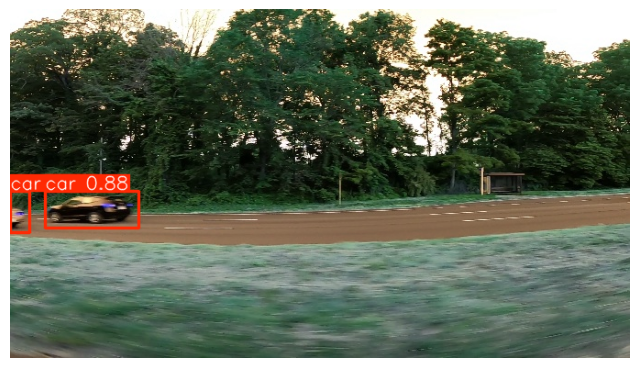


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_21320.jpg: 384x640 1 car, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


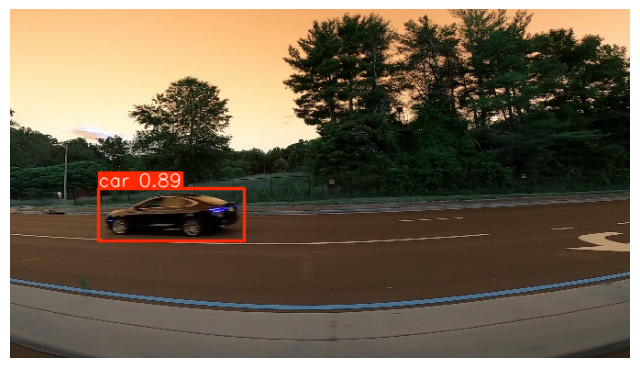


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_13900.jpg: 384x640 1 car, 25.1ms
Speed: 2.5ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


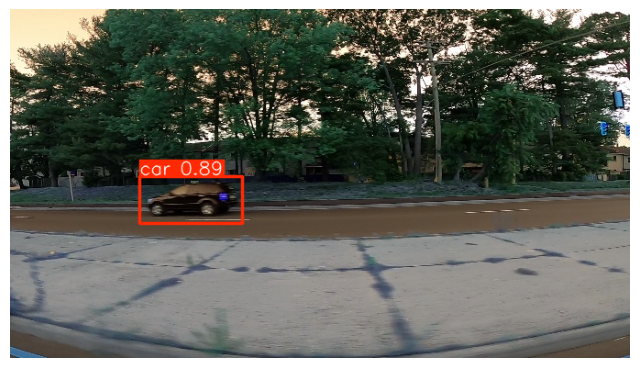


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_12140.jpg: 384x640 2 cars, 25.2ms
Speed: 2.4ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


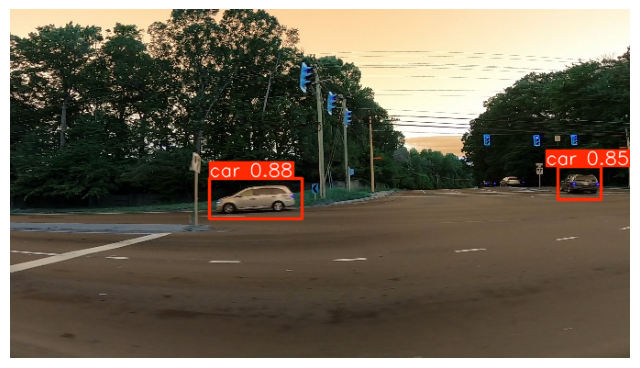


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_13860.jpg: 384x640 3 cars, 25.1ms
Speed: 2.6ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


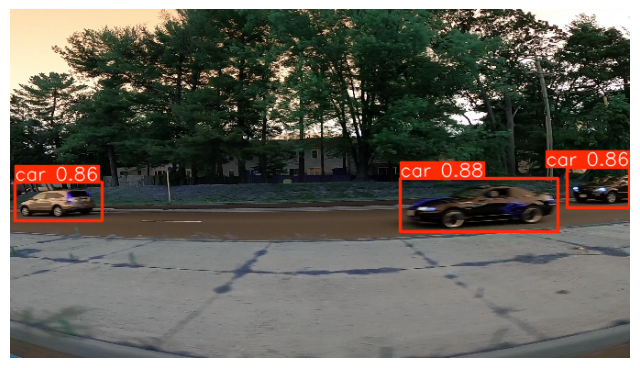


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_21440.jpg: 384x640 1 car, 25.2ms
Speed: 2.4ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


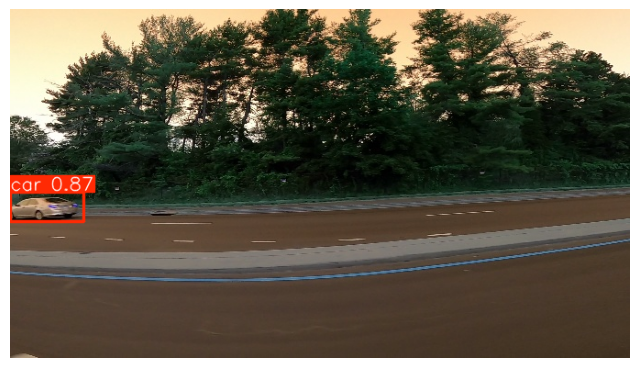


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_17580.jpg: 384x640 2 cars, 25.2ms
Speed: 2.4ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


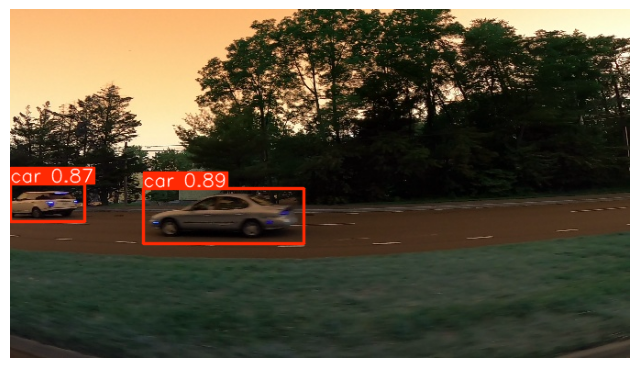


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_16160.jpg: 384x640 1 car, 25.1ms
Speed: 1.6ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


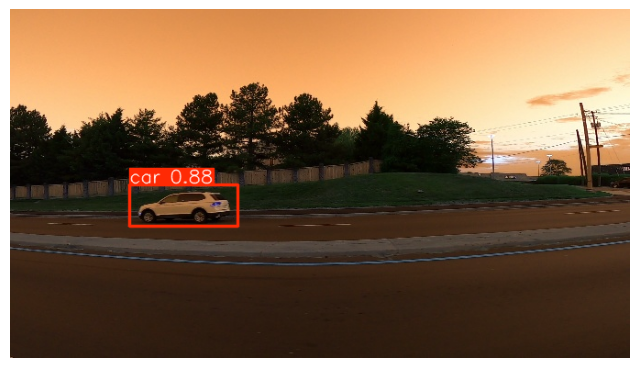


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_3120.jpg: 384x640 1 car, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


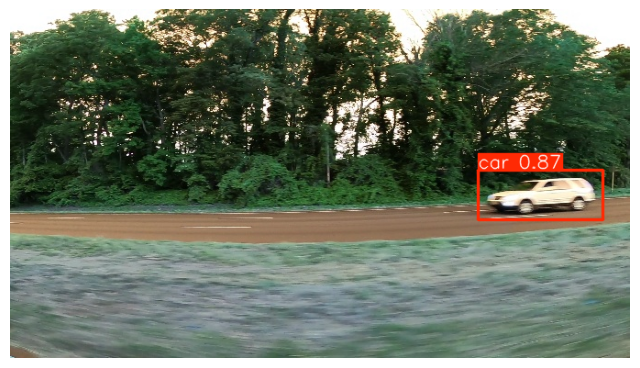


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_17340.jpg: 384x640 2 cars, 25.2ms
Speed: 1.7ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


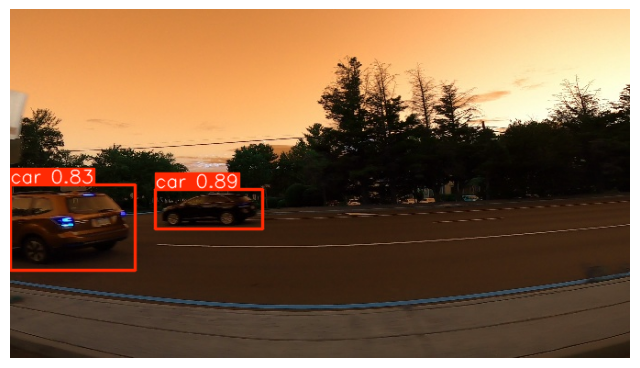


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_17440.jpg: 384x640 1 car, 25.1ms
Speed: 1.8ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


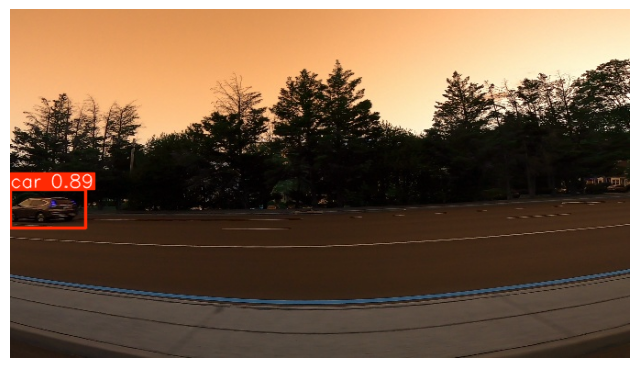


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_2100.jpg: 384x640 3 cars, 25.1ms
Speed: 1.9ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


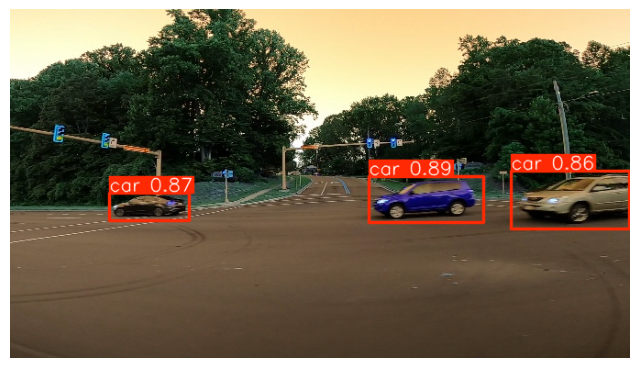


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_24760.jpg: 384x640 1 car, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


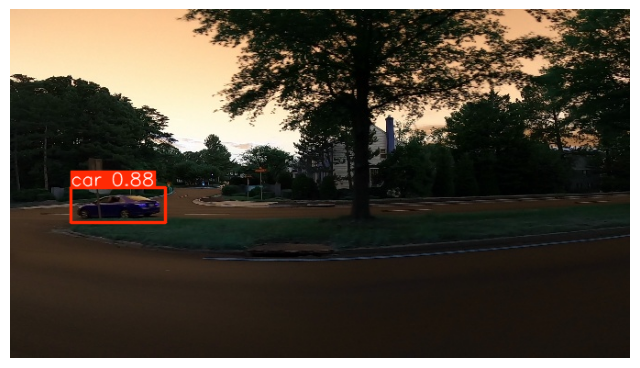


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_17360.jpg: 384x640 1 car, 25.1ms
Speed: 1.8ms preprocess, 25.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


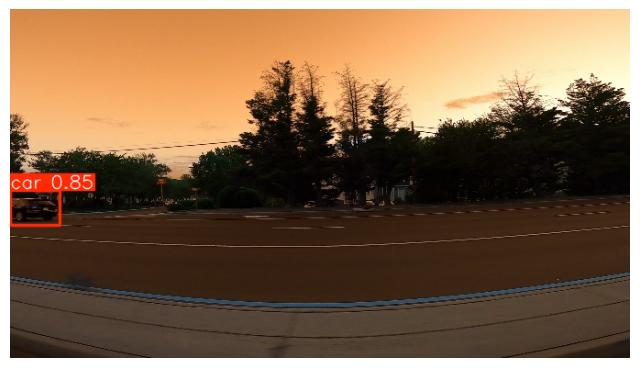


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_11420.jpg: 384x640 1 car, 25.2ms
Speed: 2.6ms preprocess, 25.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


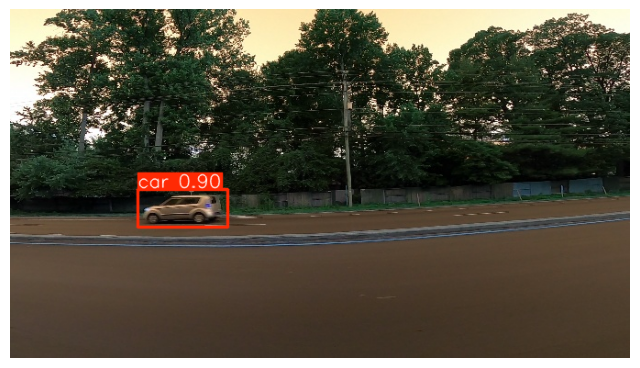


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_3840.jpg: 384x640 1 car, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


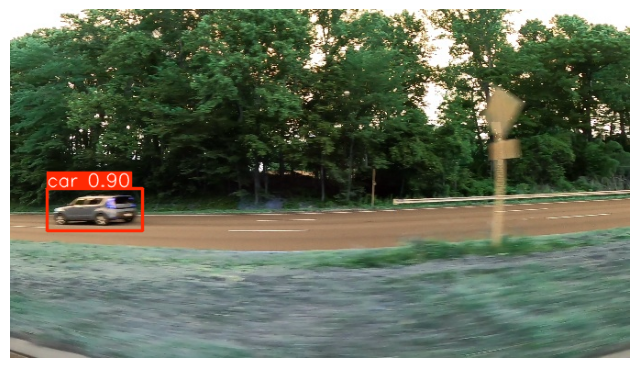


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_13800.jpg: 384x640 3 cars, 25.1ms
Speed: 1.6ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


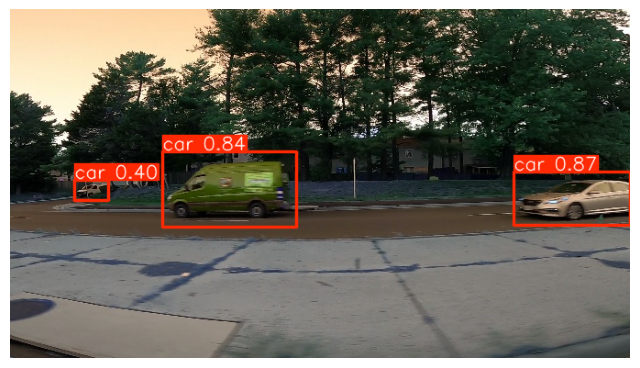


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_1960.jpg: 384x640 2 cars, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


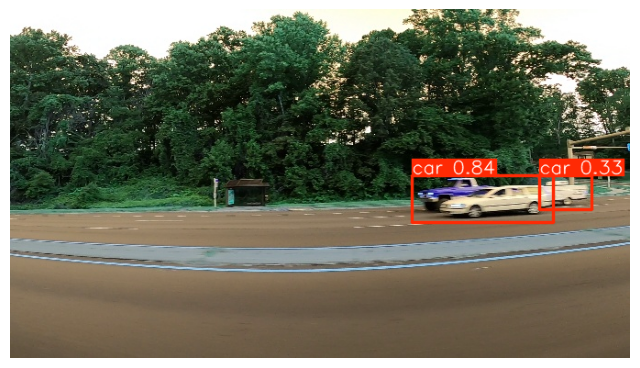


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_21620.jpg: 384x640 2 cars, 25.1ms
Speed: 1.9ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


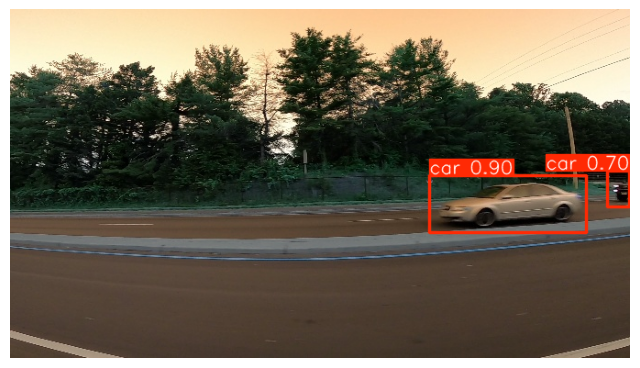


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_18880.jpg: 384x640 1 car, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


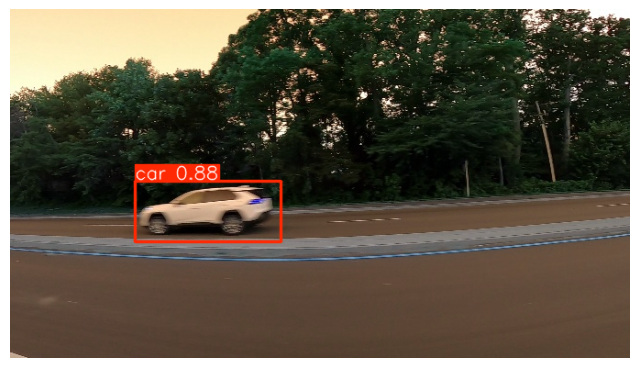


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_12160.jpg: 384x640 3 cars, 25.2ms
Speed: 1.7ms preprocess, 25.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


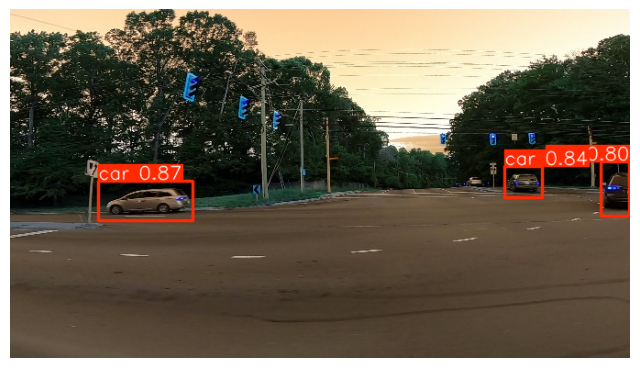


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_21420.jpg: 384x640 1 car, 25.1ms
Speed: 1.7ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


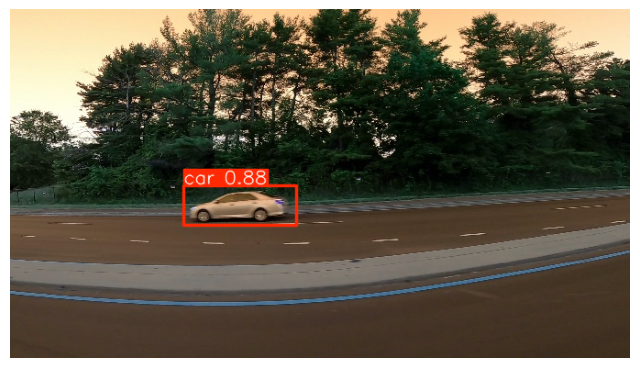


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_17140.jpg: 384x640 2 cars, 25.2ms
Speed: 2.8ms preprocess, 25.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


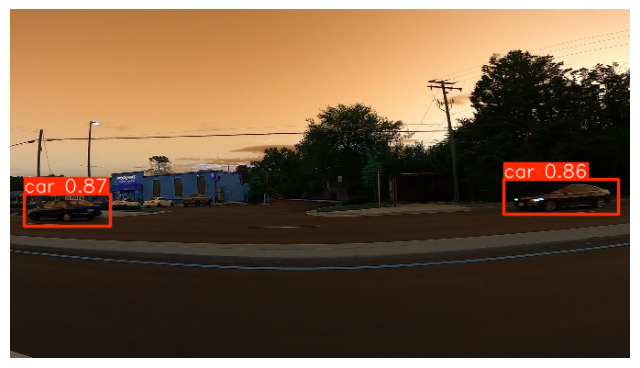


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_6420.jpg: 384x640 3 cars, 25.1ms
Speed: 2.5ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


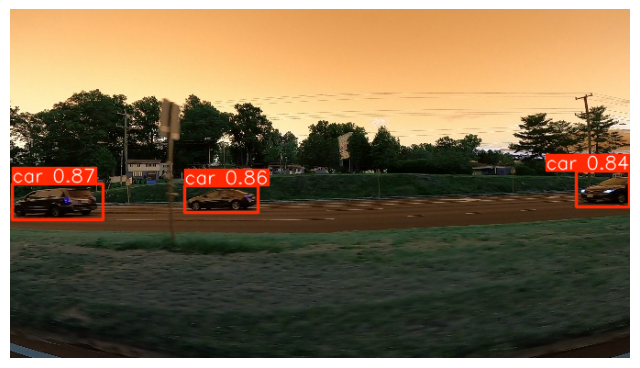


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_9980.jpg: 384x640 1 car, 25.2ms
Speed: 2.9ms preprocess, 25.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


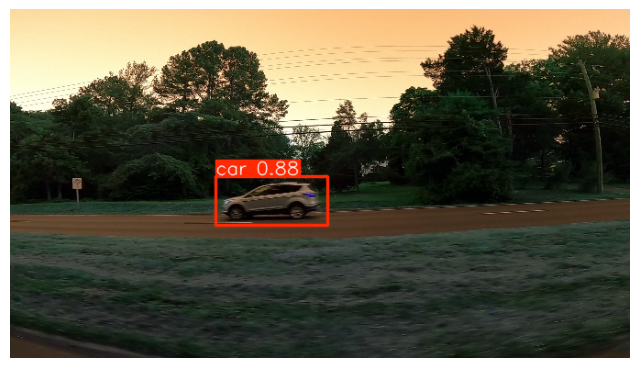

In [16]:
image_dir = "/kaggle/working/datasets/cars/images/valid"
plt.figure(figsize=(20,10))
all_images = os.listdir(image_dir)
selected_images = all_images[:40]

for img_name in selected_images:
    img_path = os.path.join(image_dir, img_name)
    results = model.predict(img_path)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for result in results:
        plotted_img = result.plot()
        plt.figure(figsize=(8, 6))
        plt.imshow(plotted_img)
        plt.axis('off')
        plt.show()
